<a href="https://colab.research.google.com/github/BobbyDrew/BigMart-Sales-Prediction/blob/main/ActivityRecognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Discard the output of this cell
%%capture

# Install the required libraries
!pip install pafy youtube.dl moviepy

In [ ]:
import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt


from moviepy.editor import*
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import*
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [ ]:
seed_constant=27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [ ]:
%%capture

# Download the UCF50 Dataset
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

# Extract the Dataset
!unrar x UCF50.rar

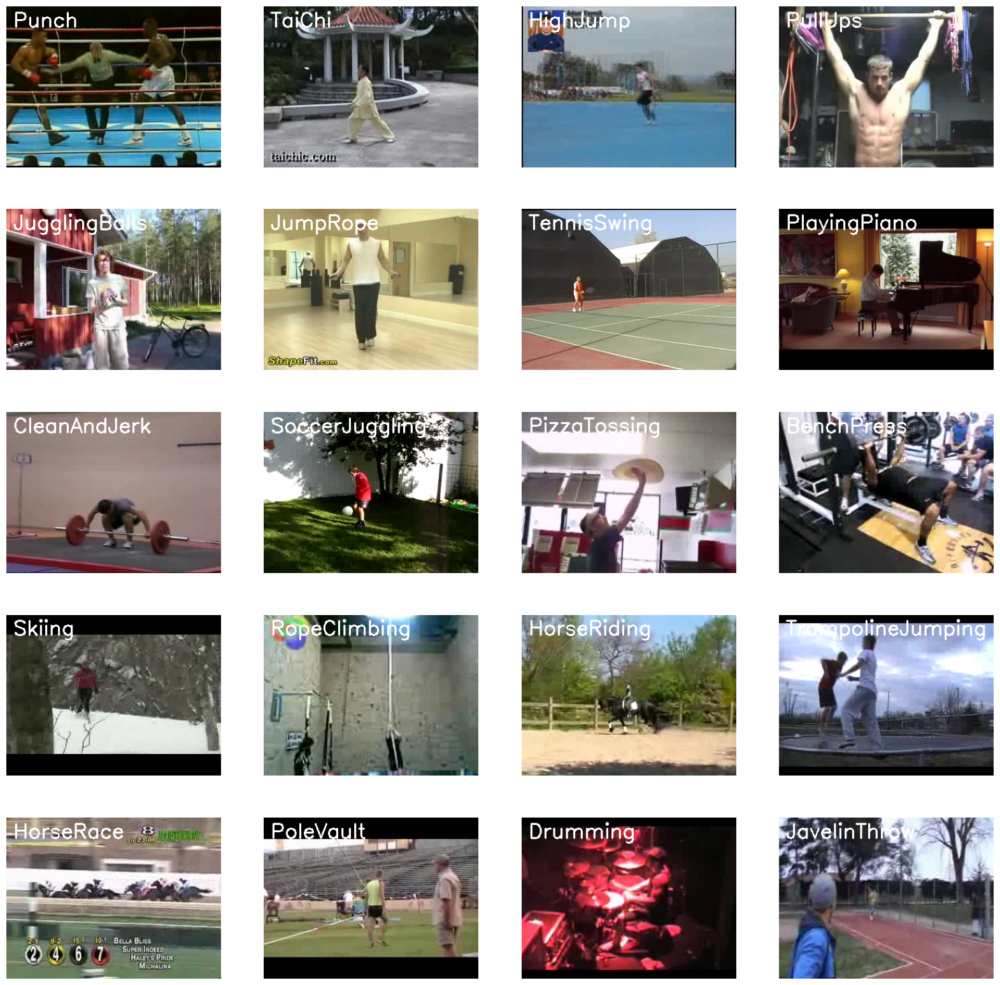

In [ ]:
# Create a Matplotlib figure
plt.figure(figsize=(20,20))

# Get the names of the classes in UCF50
all_classes_names = os.listdir('UCF50')

# Generate a list of 20 random classes
random_range = random.sample(range(len(all_classes_names)),20)

# Iterate through all the generated random values
for counter, random_index in enumerate(random_range,1):

  # Class name using Random Index
  selected_class_name = all_classes_names[random_index]

  # Video Files present in randomly selected classes
  video_files_names_list = os.listdir(f'UCF50/{selected_class_name}')

  # Randomly select a video file
  selected_video_file_name = random.choice(video_files_names_list)

  # Videocapture to read the video
  video_reader = cv2.VideoCapture(f'UCF50/{selected_class_name}/{selected_video_file_name}')

  # Read the first frame of the video file
  _, bgr_frame = video_reader.read()

  # Realease the VideoCapture object
  video_reader.release()

  # Convert the frame drom BGR into RGB format
  rgb_frame = cv2.cvtColor(bgr_frame,cv2.COLOR_BGR2RGB)

  # The class name of video frame
  cv2.putText(rgb_frame, selected_class_name,(10,30),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2)

  # Display the frame
  plt.subplot(5,4,counter);plt.imshow(rgb_frame);plt.axis('off')


In [ ]:
# Specify the height and width of the frame
IMAGE_HEIGHT,IMAGE_WIDTH=64,64

# Define the frames per video
SEQUENCE_LENGTH=20

DATASET_DIR="UCF50"

CLASSES_LIST=["HorseRace","WalkingWithDog","TaiChi","Swing"]

In [ ]:
def frames_extraction(video_path):
  frames_list=[]

  video_reader=cv2.VideoCapture(video_path)

  video_frames_count=int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

  skip_frames_window=max(int(video_frames_count/SEQUENCE_LENGTH),1)

  for frame_counter in range(SEQUENCE_LENGTH):

    video_reader.set(cv2.CAP_PROP_POS_FRAMES,frame_counter*skip_frames_window)

    success,frame=video_reader.read()

    if not success:
      break

    resized_frame=cv2.resize(frame,(IMAGE_HEIGHT,IMAGE_WIDTH))

    normalized_frame=resized_frame/255

    frames_list.append(normalized_frame)

  video_reader.release()

  return frames_list

In [ ]:
def create_dataset():

  features=[]
  labels=[]
  video_files_paths=[]

  for class_index,class_name in enumerate(CLASSES_LIST):

    print(f'Extracting Data of Class: {class_name}')

    files_list=os.listdir(os.path.join(DATASET_DIR,class_name))

    for file_name in files_list:

      video_file_path = os.path.join(DATASET_DIR,class_name,file_name)

      frames = frames_extraction(video_file_path)

      if len(frames)==SEQUENCE_LENGTH:

        features.append(frames)
        labels.append(class_index)
        video_files_paths.append(video_file_path)

  features=np.asarray(features)
  labels=np.array(labels)

  return features,labels,video_files_paths

In [ ]:
# Create Dataset
features,labels,video_files_paths=create_dataset()

Extracting Data of Class: HorseRace
Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing


In [ ]:
# Into one hot-encoded
one_hot_encoded_labels=to_categorical(labels)

In [ ]:
# Split the data into Train and Test
features_train, features_test, labels_train, labels_test = train_test_split(features,one_hot_encoded_labels,test_size=0.25,shuffle=True,random_state=seed_constant)

In [ ]:
# We will use ConvLSTM
# We will use sequential model for model construction
def create_convlstm_model():
  model=Sequential()

  # Define model Architecture
  model.add(ConvLSTM2D(filters=4,kernel_size=(3,3),activation='tanh',data_format="channels_last",recurrent_dropout=0.2,return_sequences=True,input_shape=(SEQUENCE_LENGTH,IMAGE_HEIGHT,IMAGE_WIDTH,3)))

  model.add(MaxPooling3D(pool_size=(1,2,2),padding='same',data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))

  model.add(ConvLSTM2D(filters=8,kernel_size=(3,3),activation='tanh',data_format="channels_last",recurrent_dropout=0.2,return_sequences=True))

  model.add(MaxPooling3D(pool_size=(1,2,2),padding='same',data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))

  model.add(ConvLSTM2D(filters=14,kernel_size=(3,3),activation='tanh',data_format="channels_last",recurrent_dropout=0.2,return_sequences=True))

  model.add(MaxPooling3D(pool_size=(1,2,2),padding='same',data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))

  model.add(ConvLSTM2D(filters=16,kernel_size=(3,3),activation='tanh',data_format="channels_last",recurrent_dropout=0.2,return_sequences=True))

  model.add(MaxPooling3D(pool_size=(1,2,2),padding='same',data_format='channels_last'))
  #model.add(TimeDistributed(Dropout(0.2)))

  model.add(Flatten())

  model.add(Dense(len(CLASSES_LIST),activation="softmax"))

  model.summary()
  return model

In [ ]:
# Construct a convlstm model
convlstm_model = create_convlstm_model()
print("Model Successfully created")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 20, 62, 62, 4)     1024      
                                                                 
 max_pooling3d (MaxPooling3  (None, 20, 31, 31, 4)     0         
 D)                                                              
                                                                 
 time_distributed (TimeDist  (None, 20, 31, 31, 4)     0         
 ributed)                                                        
                                                                 
 conv_lstm2d_1 (ConvLSTM2D)  (None, 20, 29, 29, 8)     3488      
                                                                 
 max_pooling3d_1 (MaxPoolin  (None, 20, 15, 15, 8)     0         
 g3D)                                                            
                                                        

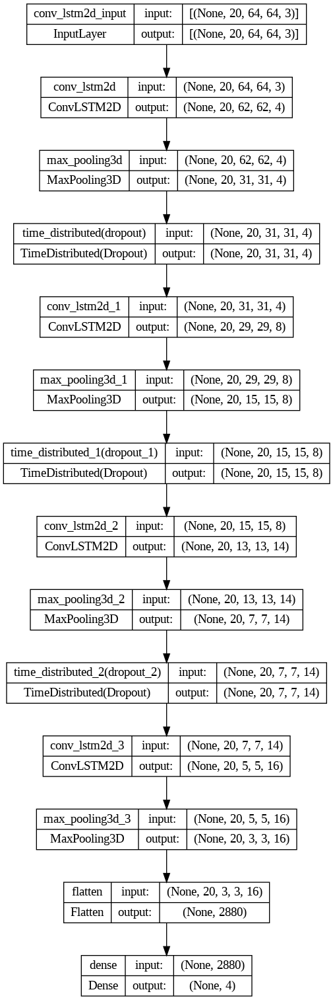

In [ ]:
# Check model structure
plot_model(convlstm_model,to_file="convlstm_model_structure_plot.png",show_shapes=True,show_layer_names=True)

In [ ]:
# Compile and Train the model
# Create an instance of Early Stopping Callback
early_stopping_callback=EarlyStopping(monitor='val_loss',patience=10,mode='min',restore_best_weights=True)
convlstm_model.compile(loss='categorical_crossentropy',optimizer='Adam',metrics=["accuracy"])

# Training the model
convlstm_model_training_history=convlstm_model.fit(x=features_train,y=labels_train,epochs=50,batch_size=4,
                                                   shuffle=True,validation_split=0.2,callbacks=[early_stopping_callback])

Epoch 1/50
73/73 [==============================] - 132s 2s/step - loss: 1.4010 - accuracy: 0.2500 - val_loss: 1.3579 - val_accuracy: 0.2740
Epoch 2/50
73/73 [==============================] - 123s 2s/step - loss: 1.3549 - accuracy: 0.3082 - val_loss: 1.2897 - val_accuracy: 0.4384
Epoch 3/50
73/73 [==============================] - 124s 2s/step - loss: 1.2100 - accuracy: 0.4829 - val_loss: 1.2023 - val_accuracy: 0.5068
Epoch 4/50
73/73 [==============================] - 123s 2s/step - loss: 0.9983 - accuracy: 0.6130 - val_loss: 1.0640 - val_accuracy: 0.5342
Epoch 5/50
73/73 [==============================] - 123s 2s/step - loss: 0.8165 - accuracy: 0.7055 - val_loss: 0.8724 - val_accuracy: 0.6438
Epoch 6/50
73/73 [==============================] - 124s 2s/step - loss: 0.6462 - accuracy: 0.7500 - val_loss: 0.8990 - val_accuracy: 0.6438
Epoch 7/50
73/73 [==============================] - 123s 2s/step - loss: 0.4885 - accuracy: 0.8219 - val_loss: 0.6101 - val_accuracy: 0.7397
Epoch 8/50
73

In [ ]:
# Evaluate the model accuracy
model_evaluation_history=convlstm_model.evaluate(features_test,labels_test)

4/4 [==============================] - 13s 3s/step - loss: 1.3060 - accuracy: 0.6721


In [ ]:
# Plotting model accuracy
def plot_metric(model_training_history,metric_name_1,metric_name_2,plot_name):

  metric_value_1=model_training_history.history[metric_name_1]
  metric_value_2=model_training_history.history[metric_name_2]

  epochs=range(len(metric_value_1))

  plt.plot(epochs,metric_value_1,'blue',label=metric_name_1)
  plt.plot(epochs,metric_value_2,'red',label=metric_name_2)

  plt.title(str(plot_name))
  plt.legend()

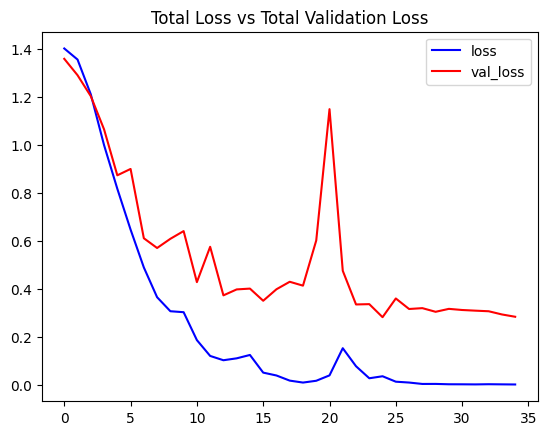

In [ ]:
# Visuaize the training and loss metrices
plot_metric(convlstm_model_training_history,'loss','val_loss','Total Loss vs Total Validation Loss')

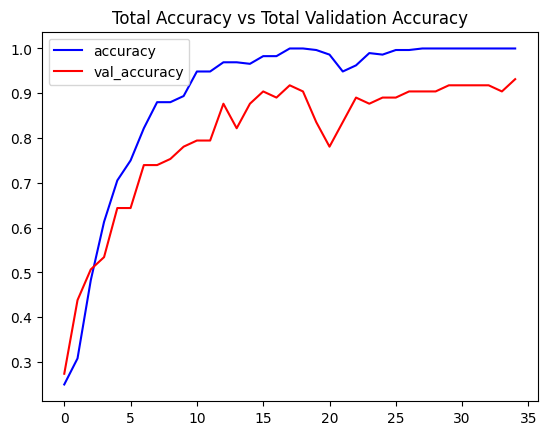

In [ ]:
# Visuaize the training and validation accuracy metrices
plot_metric(convlstm_model_training_history,'accuracy','val_accuracy','Total Accuracy vs Total Validation Accuracy')

# Saving and Downloading the video for extraction

In [ ]:
# Save the model for future use
model_evaluation_loss,model_evaluation_accuracy=model_evaluation_history

date_time_format='%Y_%m_%d__%H_%M_%S'
current_date_time_dt=dt.datetime.now()
current_date_time_string=dt.datetime.strftime(current_date_time_dt,date_time_format)

model_file_name=f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

convlstm_model.save(model_file_name)

  saving_api.save_model(



In [ ]:
# Create a function to download Youtube Videos
def download_youtube_videos(youtube_video_url,output_directory):

  video=pafy.new(youtube_video_url)
  title=video.title
  video_best=video.getbest()
  output_file_path=f'{output_directory}/{title}.mp4'

  video_best.download(filepath=output_file_path,quite=True)
  return title

In [ ]:
!pip install --upgrade youtube-dl

In [ ]:
!pip install pytube

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.7 MB/s eta 0:00:00


In [ ]:
from pytube import YouTube
import os

def download_youtube_videos(youtube_video_url, output_directory):
    yt = YouTube(youtube_video_url)
    stream = yt.streams.get_highest_resolution()
    output_file_path = os.path.join(output_directory, f"{yt.title}.mp4")
    stream.download(output_directory)
    return yt.title

# Downloading a youtube video
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)
video_title = download_youtube_videos('https://youtu.be/8u0qjmHIOcE?si=NfcBW0Gw0u5JX_Id', test_videos_directory)

input_video_file_path = os.path.join(test_videos_directory, f"{video_title}.mp4")

print("Download complete!")

Download complete!


In [ ]:
# Create a function to perform action recognition on videos
def predict_on_video(video_file_path,output_file_path,SEQUENCE_LENGTH):

  video_reader=cv2.VideoCapture(video_file_path)

  original_video_width=int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
  original_video_height=int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

  video_writer=cv2.VideoWriter(output_file_path,cv2.VideoWriter_fourcc('M','P','4','V'),video_reader.get(cv2.CAP_PROP_FPS),(original_video_width,original_video_height))

  frames_queue=deque(maxlen=SEQUENCE_LENGTH)

  predicted_class_name=""
6
  while video_reader.isOpened():
    ok,frame=video_reader.read()

    if not ok:
      break

    resized_frame=cv2.resize(frame,(IMAGE_HEIGHT,IMAGE_WIDTH))
    normalized_frame=resized_frame/255
    frames_queue.append(normalized_frame)

    if len(frames_queue)==SEQUENCE_LENGTH:
      predicted_labels_probabilities=convlstm_model.predict(np.expand_dims(frames_queue,axis=0))[0]
      predicted_label=np.argmax(predicted_labels_probabilities)
      predicted_class_name=CLASSES_LIST[predicted_label]

    cv2.putText(frame,predicted_class_name,(10,30),cv2.FONT_HERSHEY_SIMPLEX,1,(0,255,0),2)
    video_writer.write(frame)

  video_reader.release()
  video_writer.release()

In [ ]:
import cv2
from collections import deque
# Perform the recognition on test video
output_video_file_path=f'{test_videos_directory}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'

# Predict the action recognition
predict_on_video(input_video_file_path,output_video_file_path,SEQUENCE_LENGTH)

# Display the output video
VideoFileClip(output_video_file_path,audio=False,target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 136ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  98%|█████████▊| 851/867 [00:04<00:00, 171.87it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/Test Video-Output-SeqLen20.mp4, 360000 bytes wanted but 0 bytes read,at frame 866/867, at time 31.04/31.04 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


# On Single Video

In [ ]:
def predict_single_video(video_file_path,SEQUENCE_LENGTH):

  video_reader=cv2.VideoCapture(video_file_path)
  original_video_width=int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
  original_video_height=int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

  frames_list=[]
  predicted_class_name=''
  video_frames_count=int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

  skip_frames_window=max(int(video_frames_count/SEQUENCE_LENGTH),1)

  for frame_counter in range(SEQUENCE_LENGTH):
    video_reader.set(cv2.CAP_PROP_POS_FRAMES,frame_counter*skip_frames_window)
    success,frame=video_reader.read()

    if not success:
      break

    resized_frame=cv2.resize(frame,(IMAGE_HEIGHT,IMAGE_WIDTH))
    normalize_frame=resized_frame/255
    frames_list.append(normalize_frame)

  predicted_labels_probabilities=LRCN_model.predict(np.expand_dims(frames_list,axis=0))[0]

  predicted_label=np.argmax(predicted_labels_probabilities)

  predicted_class_name=CLASSES_LIST[predicted_label]

  print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

  video_reader.release()


In [ ]:
# Download the youtube video
video_title = download_youtube_videos('LINK',test_videos_directory)
input_video_file_path=f'{test_videos_directory}/{video_title}.mp4'
predict_single_video(input_video_file_path,SEQUENCE_LENGTH)
VideoFileClip(input_video_file_path,audio=False,target_resolution=(300,None)).ipython_display()

In [ ]:
from flask import Flask, render_template, request
from pytube import YouTube
import os

app = Flask(__name__)

# Function to download YouTube videos
def download_youtube_videos(youtube_video_url, output_directory):
    yt = YouTube(youtube_video_url)
    stream = yt.streams.get_highest_resolution()
    output_file_path = os.path.join(output_directory, f"{yt.title}.mp4")
    stream.download(output_directory)
    return yt.title

@app.route('/', methods=['GET', 'POST'])
def index():
    if request.method == 'POST':
        # Get the YouTube video link from the form
        youtube_link = request.form['youtube_link']
        # Download the YouTube video
        video_title = download_youtube_videos(youtube_link, 'static/videos')
        input_video_file_path = os.path.join('static/videos', f"{video_title}.mp4")
        return render_template('result.html', input_video=input_video_file_path)
    return render_template('index.html')

if __name__ == '__main__':
    app.run(debug=True)